In [1]:
import scanpy as sc
from spin import spin
import numpy as np
import matplotlib.pyplot as plt

# Find regions in a single sample

In [2]:
adata_marmoset = sc.read(
    '/stanley/WangLab/kamal/data/spin_paper/test/marmoset.h5ad',
    backup_url='https://zenodo.org/record/8092024/files/marmoset.h5ad?download=1'
)

In [3]:
adata_marmoset = spin(
    adata_marmoset,
    n_pcs=20,
    resolution=0.3
)

2023-06-29 00:29:53,906 - SPIN - INFO - Smoothing
2023-06-29 00:29:55,779 - SPIN - INFO - Performing PCA
2023-06-29 00:29:57,711 - SPIN - INFO - Finding latent neighbors
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/dep

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


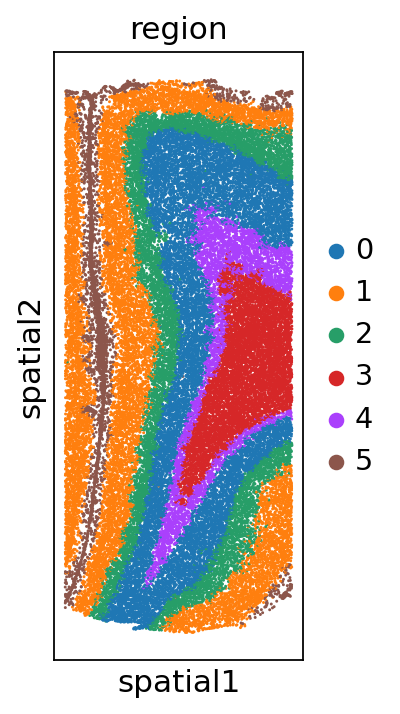

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


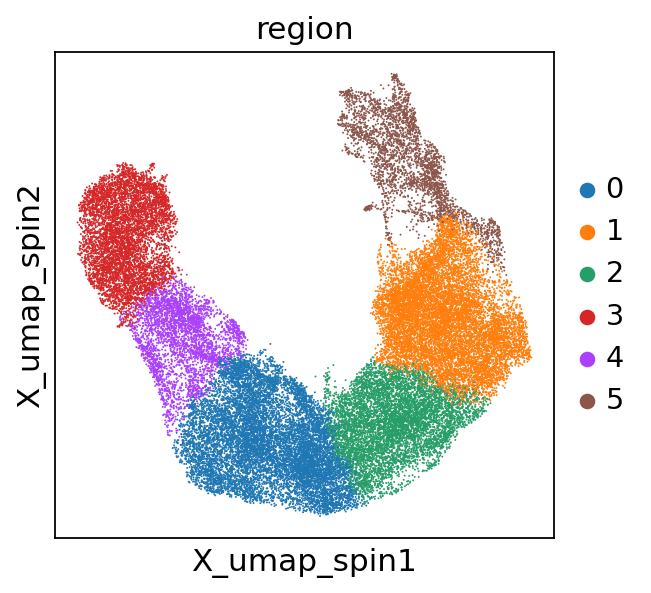

In [4]:
sc.set_figure_params(figsize=(2,5))
sc.pl.embedding(adata_marmoset, basis='spatial', color='region', s=7)
sc.set_figure_params(figsize=(4,4))
sc.pl.embedding(adata_marmoset, basis='X_umap_spin', color='region', s=3)

# Find regions across separate AnnData objects

In [5]:
adata_mouse = sc.read(
    '/stanley/WangLab/kamal/data/spin_paper/test/mouse.h5ad',
    backup_url='https://zenodo.org/record/8092024/files/mouse.h5ad?download=1'
)

In [6]:
adata = spin(
    [adata_marmoset, adata_mouse],
    batch_key='species',
    batch_labels=['marmoset', 'mouse'],
    resolution=0.7
)

2023-06-29 00:31:57,605 - SPIN - INFO - Smoothing
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
2023-06-29 00:32:01,836 - SPIN - INFO - Performing PCA
2023-06-29 00:32:03,551 - SPIN - INFO - Integrating
2023-06-29 00:32:03,693 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-06-29 00:32:22,237 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-06-29 00:32:22,709 - harmonypy - INFO - Iteration 1 of 10
2023-06-29 00:32:47,301 - harmonypy - INFO - Iteration 2 of 10
2023-06-29 00:33:11,685 - harmonypy - INFO - Converged after 2 iterations
2023-06-29 00:33:11,692 - SPIN - INFO - Integration complete
2023-06-29 00:33:11,828 - SPIN - INFO - Finding latent neighbors
2023-06-29 00:33:28,074 - SPIN - INFO - Leiden clustering
2023-06-29 00:34:07,095 - SPIN - INFO - Performing UMAP
2023-06-29 00:36:03,

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


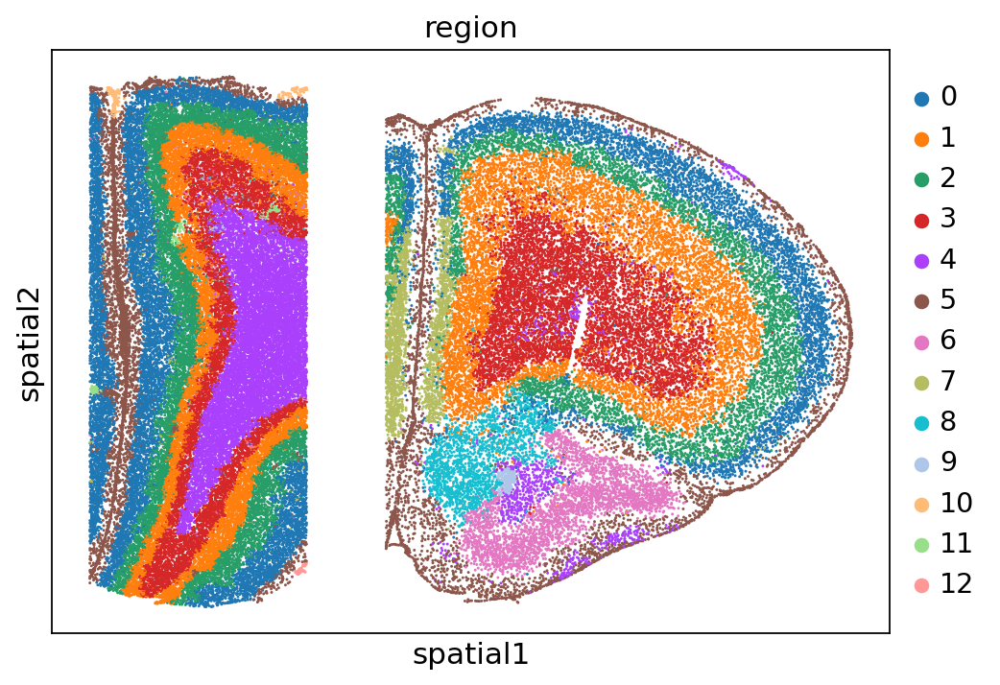

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


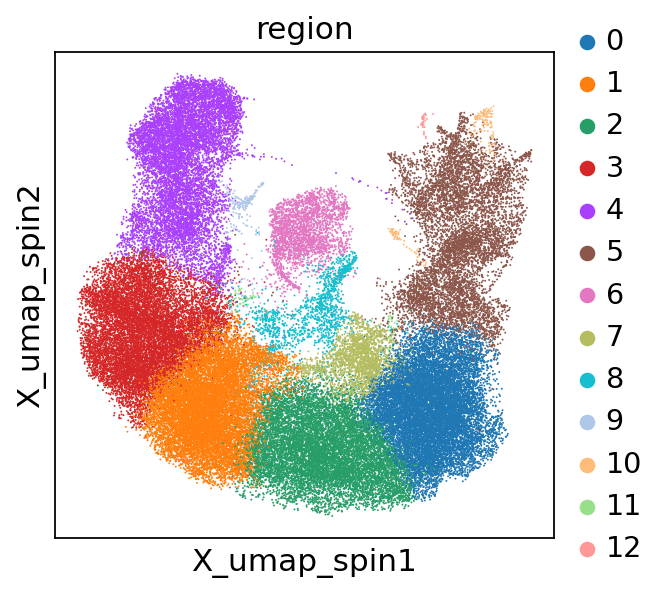

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


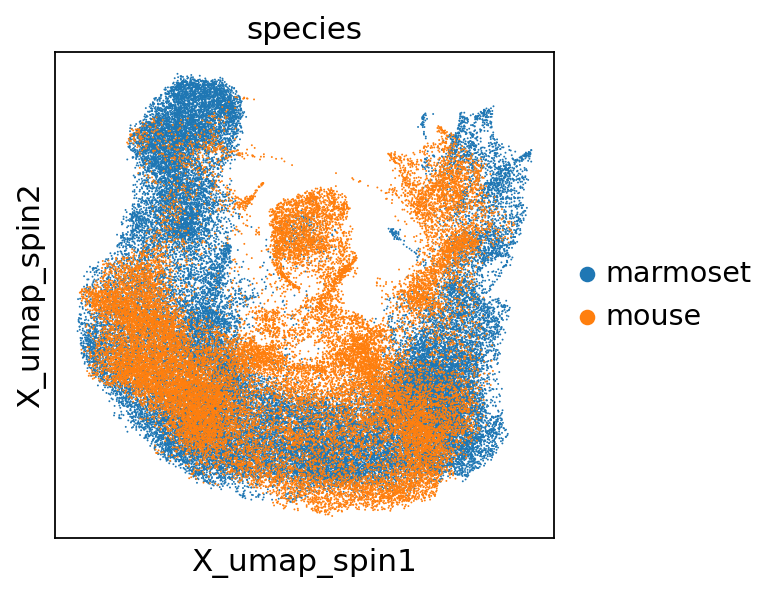

In [7]:
sc.set_figure_params(figsize=(7,5))
sc.pl.embedding(adata, basis='spatial', color='region', s=7)
sc.set_figure_params(figsize=(4,4))
sc.pl.embedding(adata, basis='X_umap_spin', color='region', s=3)
sc.set_figure_params(figsize=(4,4))
sc.pl.embedding(adata, basis='X_umap_spin', color='species', s=3)

# Find regions across batches within same AnnData object

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


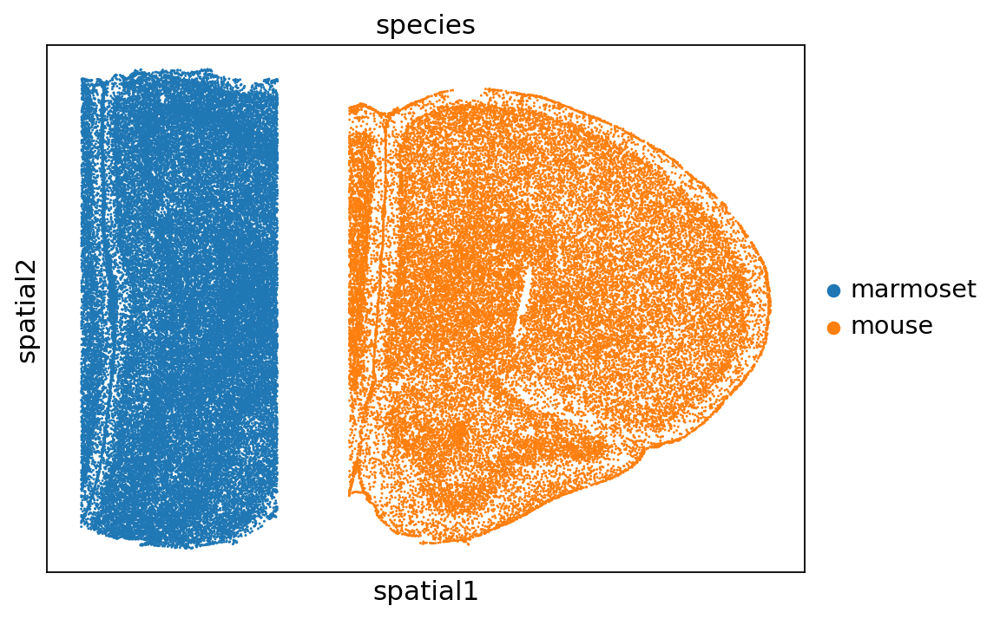

In [8]:
# Make a single AnnData object with batches labeled
adata = sc.concat(
    [adata_marmoset, adata_mouse],
    label='species',
    keys=['marmoset', 'mouse'],
)

sc.set_figure_params(figsize=(7,5))
sc.pl.embedding(adata, basis='spatial', color='species', s=7)

In [9]:
adata = spin(
    adata,
    batch_key='species',
    resolution=0.7
)

2023-06-29 00:36:07,517 - SPIN - INFO - Splitting adata by `species`
2023-06-29 00:36:07,526 - SPIN - INFO - Smoothing
2023-06-29 00:36:09,950 - SPIN - INFO - Performing PCA
2023-06-29 00:36:11,648 - SPIN - INFO - Integrating
2023-06-29 00:36:11,741 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-06-29 00:36:30,205 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-06-29 00:36:30,677 - harmonypy - INFO - Iteration 1 of 10
2023-06-29 00:36:54,986 - harmonypy - INFO - Iteration 2 of 10
2023-06-29 00:37:19,364 - harmonypy - INFO - Converged after 2 iterations
2023-06-29 00:37:19,370 - SPIN - INFO - Integration complete
2023-06-29 00:37:19,496 - SPIN - INFO - Finding latent neighbors
2023-06-29 00:37:35,628 - SPIN - INFO - Leiden clustering
2023-06-29 00:38:13,857 - SPIN - INFO - Performing UMAP
2023-06-29 00:40:09,478 - SPIN - INFO - Clustering complete


/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


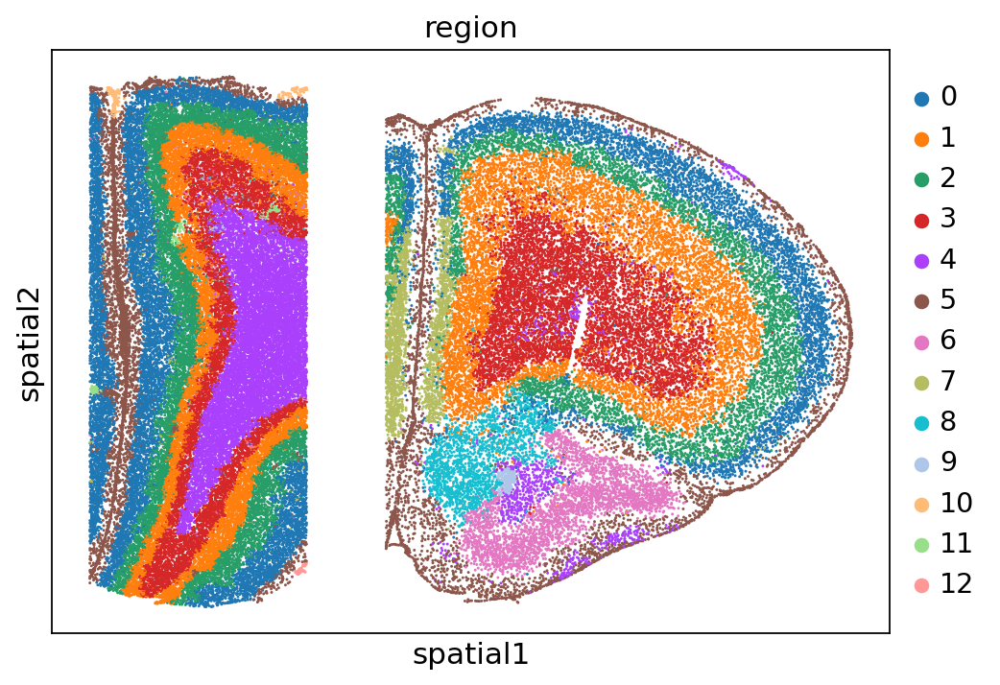

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


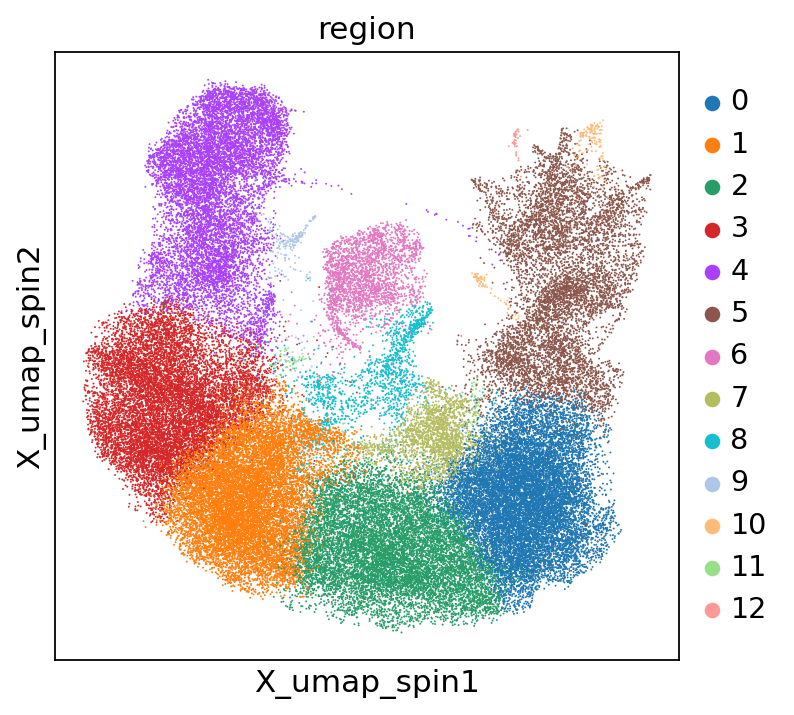

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


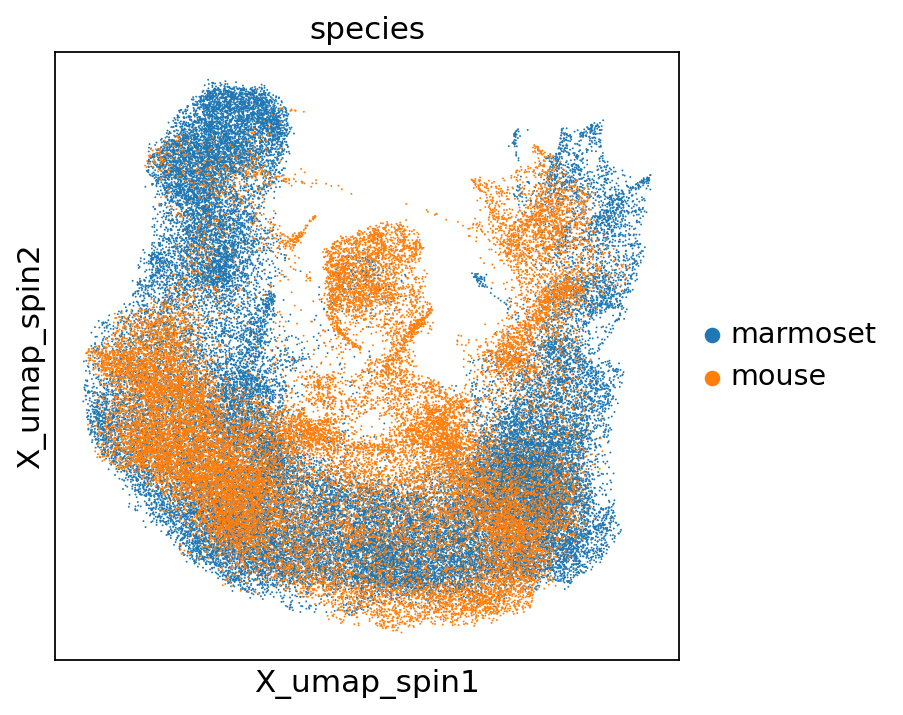

In [10]:
sc.set_figure_params(figsize=(7,5))
sc.pl.embedding(adata, basis='spatial', color='region', s=7)
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis='X_umap_spin', color='region', s=3)
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis='X_umap_spin', color='species', s=3)

# DEG analysis

## Filter regions

In [11]:
adata.obs['region'].value_counts()

region
0     13359
1     12567
2     11081
3     10994
4      9972
5      7358
6      2558
7      2037
8      1551
9       210
10      208
11      148
12       38
Name: count, dtype: int64

In [12]:
min_n_cells = 500
regions = adata.obs['region'].unique()
good_regions = [region for region in regions if adata.obs['region'].value_counts()[region] > min_n_cells]
adata = adata[np.isin(adata.obs['region'], good_regions)]

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


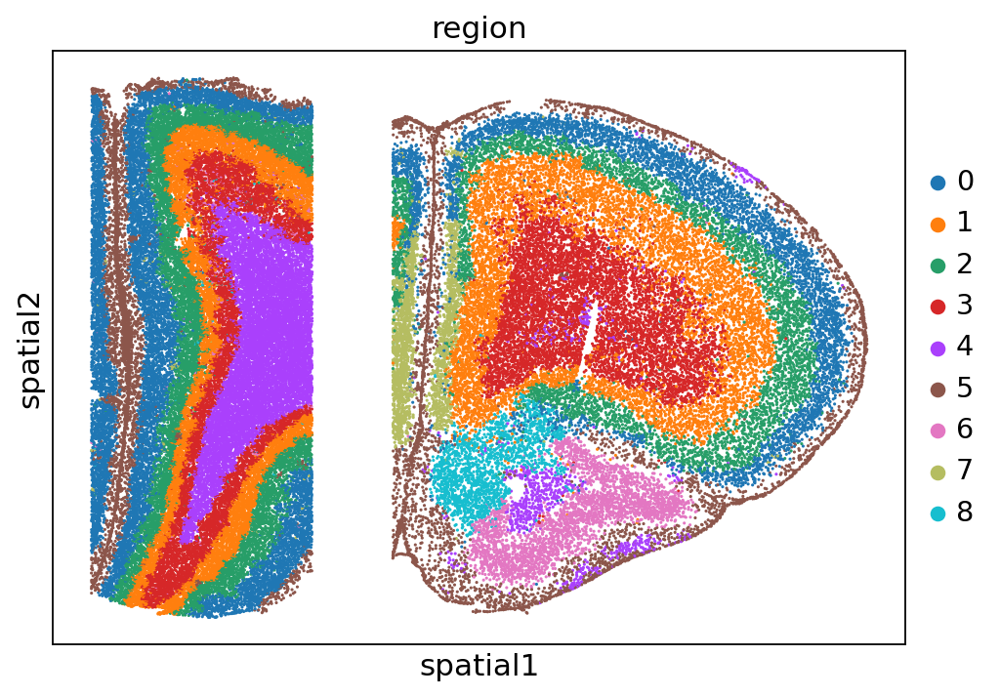

In [13]:
sc.set_figure_params(figsize=(7,5))
sc.pl.embedding(adata, basis='spatial', color='region', s=8)

## Compare across regions

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid valu

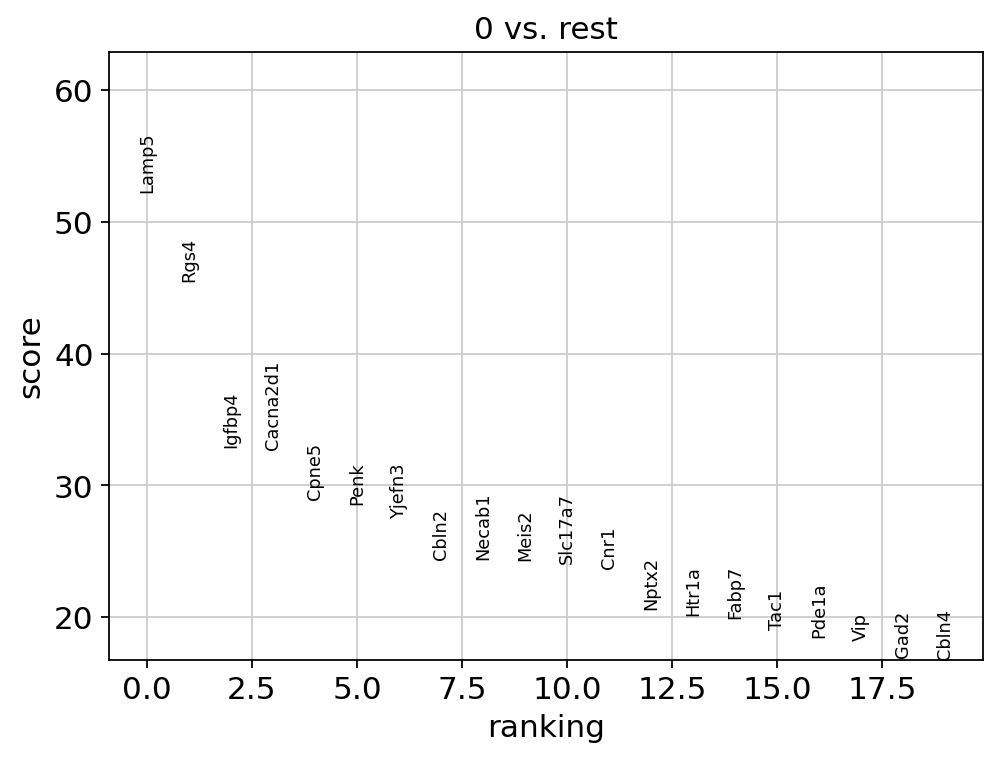

In [14]:
region = '0'
sc.tl.rank_genes_groups(adata, groupby='region')
sc.pl.rank_genes_groups(adata, groups=region)

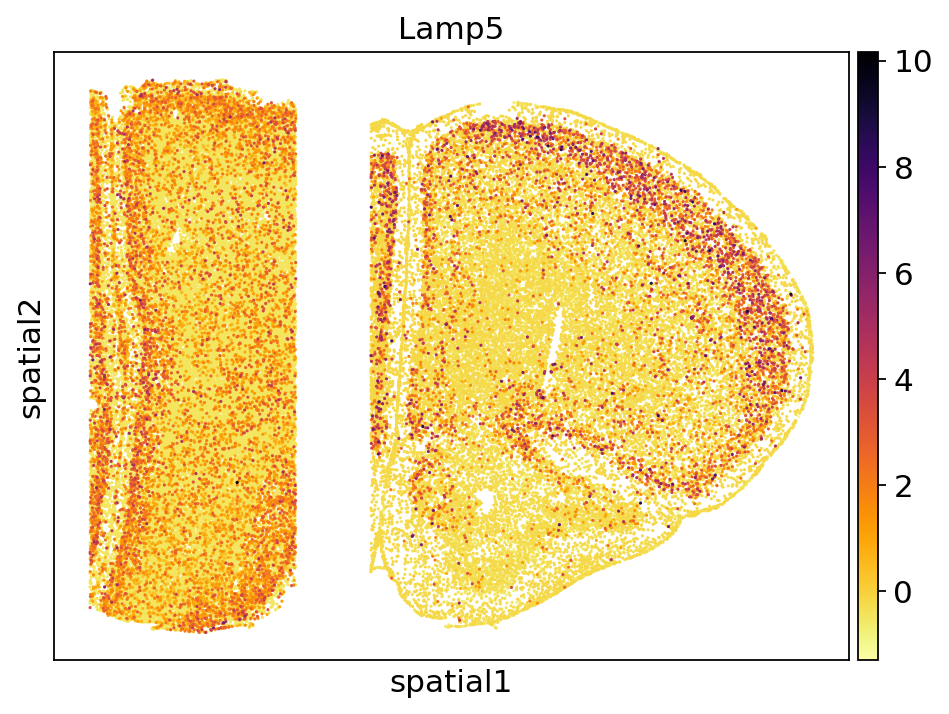

In [15]:
markers = sc.get.rank_genes_groups_df(adata, group=region)
gene = markers['names'][0]

sc.set_figure_params(figsize=(7,5))
sc.pl.embedding(adata, basis='spatial', color=gene, cmap='inferno_r', s=8)

## Compare across species

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


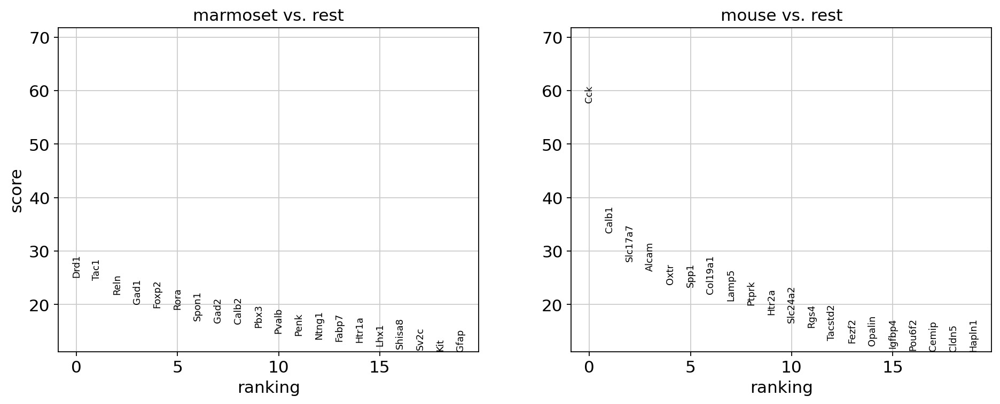

In [16]:
region = '0'
subdata = adata[adata.obs['region']==region]
sc.tl.rank_genes_groups(subdata, groupby='species')
sc.pl.rank_genes_groups(subdata)

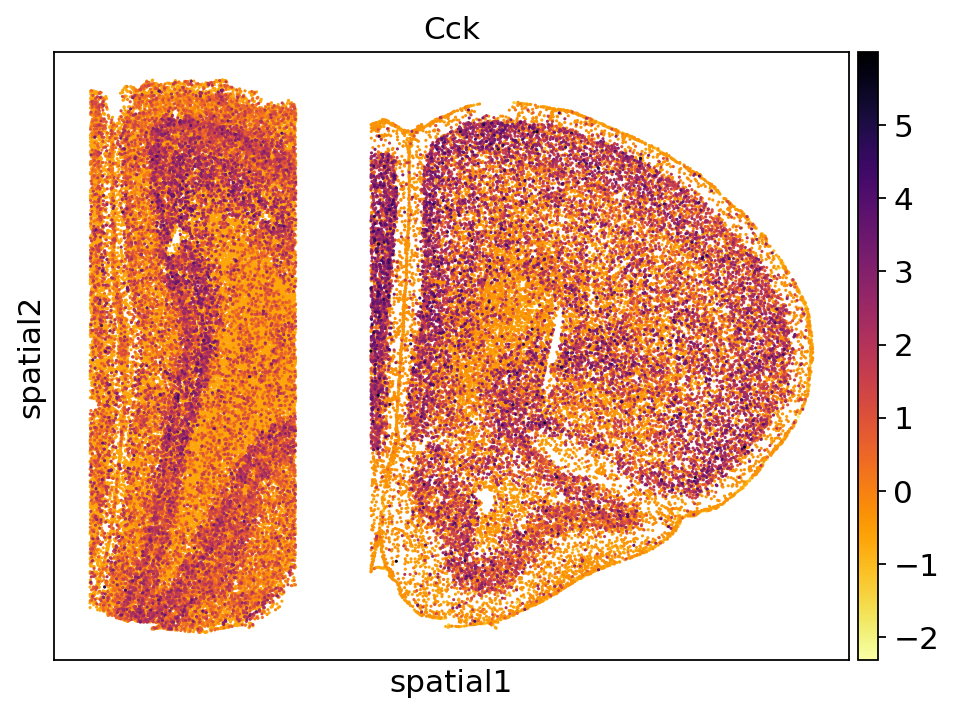

In [17]:
markers = sc.get.rank_genes_groups_df(subdata, group='mouse')
gene = markers['names'][0]

sc.set_figure_params(figsize=(7,5))
sc.pl.embedding(adata, basis='spatial', color=gene, cmap='inferno_r', s=8)

# Trajectory inference

## Diffusion maps

/stanley/WangLab/kamal/envs/spin_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


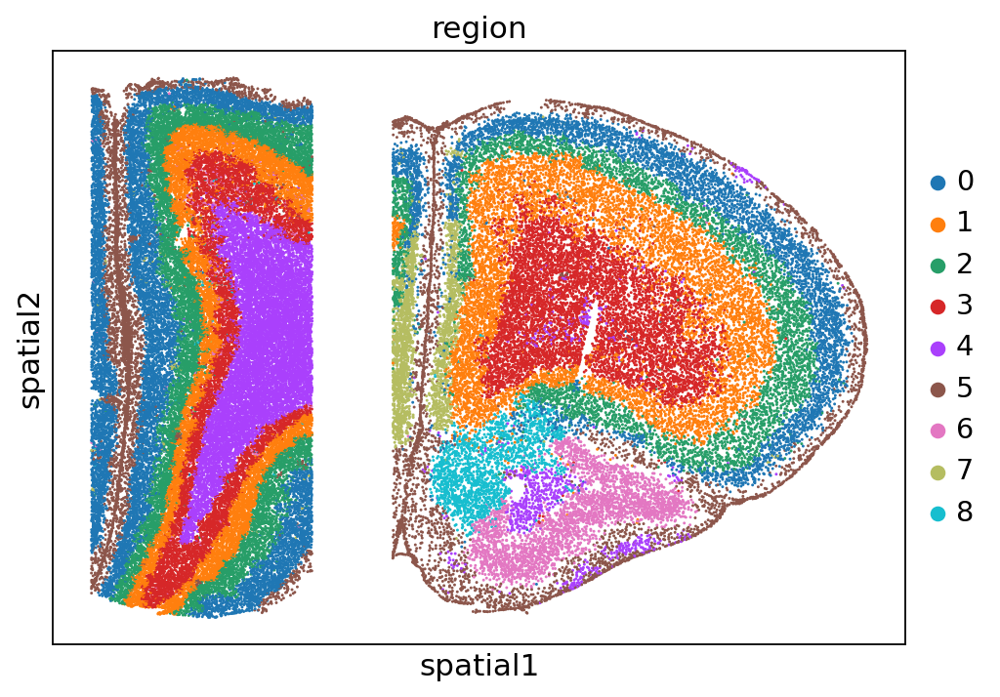

In [18]:
sc.set_figure_params(figsize=(7,5))
sc.pl.embedding(adata, basis='spatial', color='region', s=7)

In [19]:
ctx_regions = ['0', '2', '1', '3']
subdata = adata[np.isin(adata.obs['region'], ctx_regions)]
sc.tl.diffmap(subdata, neighbors_key='region')
subdata.obs['depth'] = -subdata.obsm['X_diffmap'][:,1]

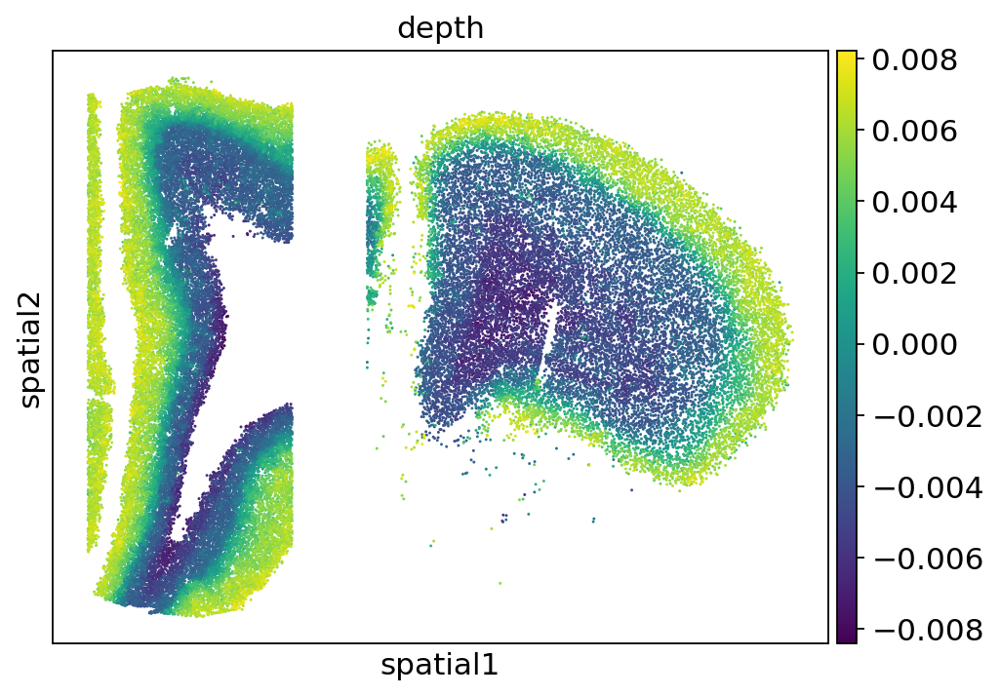

In [20]:
sc.set_figure_params(figsize=(7,5))
sc.pl.embedding(subdata, basis='spatial', color='depth', s=7)

## Calculate gene depth distributions

In [21]:
# Make bins
n_bins = 50
max_depth = subdata.obs['depth'].max()
min_depth = subdata.obs['depth'].min()
increments = (max_depth-min_depth)/n_bins
bins = np.arange(min_depth, max_depth, increments)
subdata.obs['depth_bin'] = np.digitize(subdata.obs['depth'], bins=bins) - 1 # account for idxing at 1

# Make expression nonnegative
subdata.X -= subdata.X.min()

# Separate species
subdata_marmoset = subdata[subdata.obs['species']=='marmoset']
subdata_mouse = subdata[subdata.obs['species']=='mouse']
subdatas = [subdata_marmoset, subdata_mouse]

In [22]:
def get_hists(adatas, gene, start_bin=None, end_bin=None):

    hists = []
    for subdata in adatas:

        # Initialize a few vars
        hist = np.zeros(len(subdata.obs['depth_bin'].unique()))
        depth = subdata.obs['depth_bin'].values
        expr = subdata[:,gene].X.flatten()

        # Wanted to just use np.histogram here to get counts, but it has known binning diffs from np.digitize
        nonzero_counts = subdata.obs['depth_bin'].value_counts().sort_index()
        bin_counts = np.zeros(len(nonzero_counts))
        for i in nonzero_counts.index:
            bin_counts[i] = nonzero_counts.loc[i]

        # Add each cell's expression into corresponding cell depth bin
        for i in range(len(subdata)):
            hist[depth[i]] += expr[i] / bin_counts[depth[i]]
        
        hist = hist[start_bin:end_bin]

        # Normalize wrt given dataset
        hist /= hist.sum()
        hists.append(hist)
    
    return hists

In [23]:
# Bins at extreme depth values contain a small number of cells and are thus noisy.
# Ignoring bins at extreme depth values:
start_bin = 5
end_bin = 45

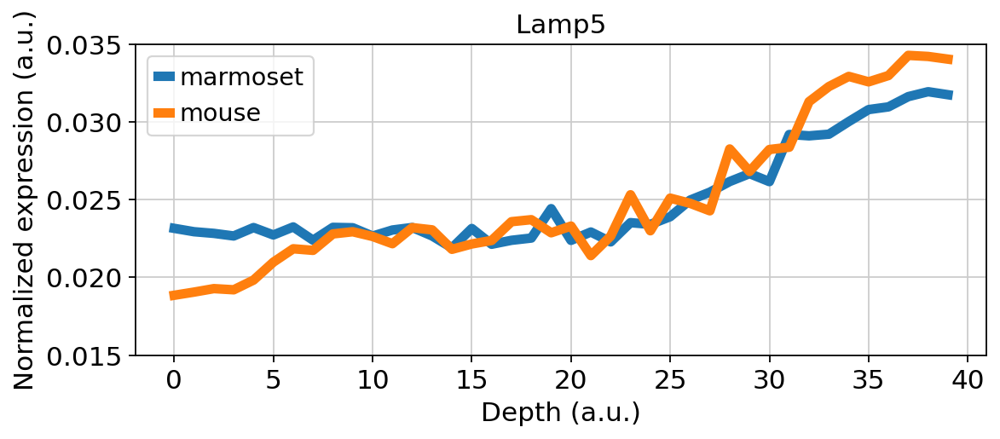

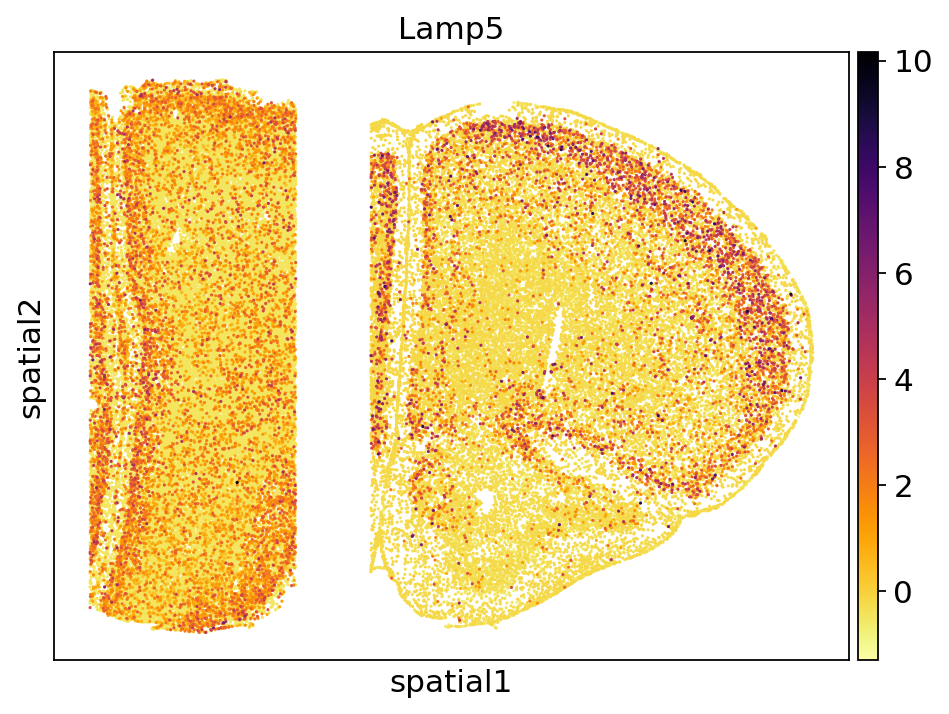

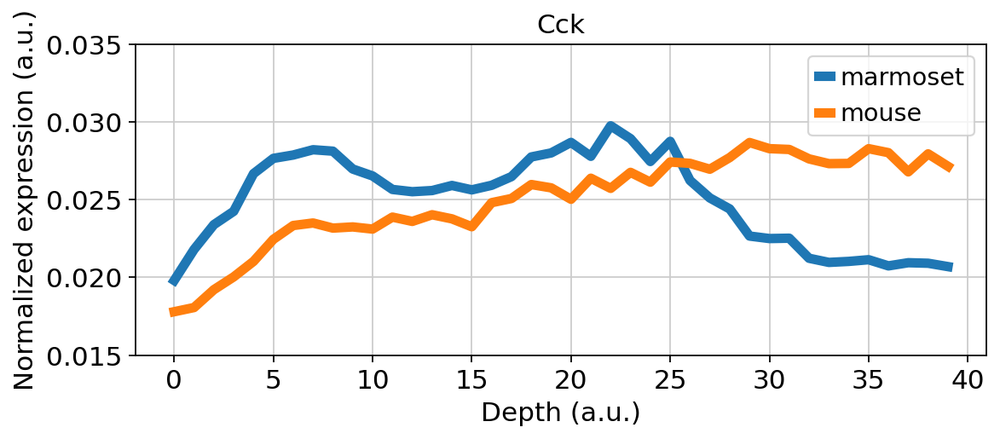

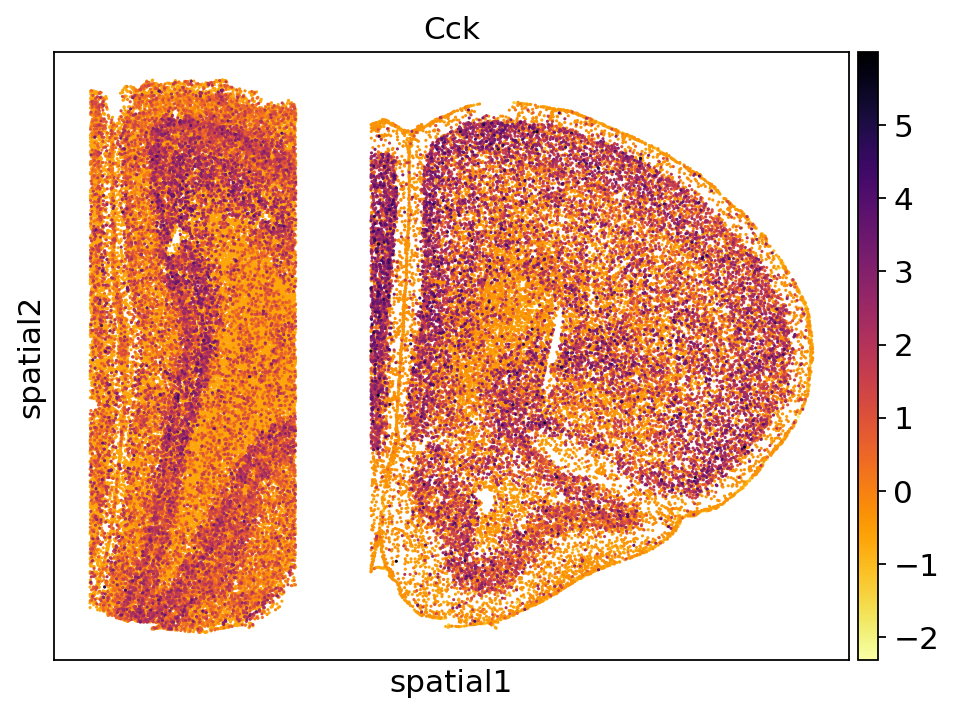

In [24]:
species = ['marmoset', 'mouse']
genes = ['Lamp5', 'Cck']
sc.set_figure_params(figsize=(7,5))

for gene in genes:

    hists = get_hists(subdatas, gene, start_bin=start_bin, end_bin=end_bin)
    plt.figure(figsize=(8,3))
    for i in range(len(hists)):
        plt.plot(hists[i], label=species[i], linewidth=5)
    plt.title(gene)
    plt.legend()
    plt.xlabel('Depth (a.u.)')
    plt.ylabel('Normalized expression (a.u.)')
    plt.ylim(0.015, 0.035)
    plt.show()

    sc.pl.embedding(adata, basis='spatial', color=gene, cmap='inferno_r', s=8)